Mount to my Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Install prophet

In [ ]:
pip install prophet

Import necesarry Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings(action='ignore')
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.formula.api as formula
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels as sm

Read Data

In [ ]:
chennai=pd.read_csv('/content/drive/MyDrive/Air_data/Chennai_1_year.csv')
delhi=pd.read_csv('/content/drive/MyDrive/Air_data/Delhi_1_year.csv')
mumbai=pd.read_csv('/content/drive/MyDrive/Air_data/Mumbai_1_year.csv')

In [ ]:
chennai.head()

,From Date,To Date,PM2.5,Temp,RH
0,13-04-2022 00:00,13-04-2022 00:30,NaN,20.60,78.0
1,13-04-2022 00:30,13-04-2022 01:00,NaN,20.80,76.5
2,13-04-2022 01:00,13-04-2022 01:30,NaN,20.75,76.0
3,13-04-2022 01:30,13-04-2022 02:00,NaN,20.70,76.5
4,13-04-2022 02:00,13-04-2022 02:30,NaN,20.70,77.5


In [ ]:
chennai.columns

Index(['From Date', 'To Date', 'PM2.5', 'Temp', 'RH'], dtype='object')

In [ ]:
delhi.head()

,From Date,To Date,PM2.5,Temp,RH
0,13-04-2022 00:00,13-04-2022 00:30,119.0,NaN,73.70
1,13-04-2022 00:30,13-04-2022 01:00,120.0,NaN,75.75
2,13-04-2022 01:00,13-04-2022 01:30,121.0,NaN,75.95
3,13-04-2022 01:30,13-04-2022 02:00,121.0,NaN,75.65
4,13-04-2022 02:00,13-04-2022 02:30,121.0,NaN,74.00


In [ ]:
mumbai.head()

,From Date,To Date,PM2.5,RH
0,13-04-2022 00:00,13-04-2022 00:30,42.0,99.9
1,13-04-2022 00:30,13-04-2022 01:00,66.0,99.9
2,13-04-2022 01:00,13-04-2022 01:30,NaN,NaN
3,13-04-2022 01:30,13-04-2022 02:00,NaN,NaN
4,13-04-2022 02:00,13-04-2022 02:30,NaN,NaN


Drop To Date column

In [ ]:
chennai=chennai.drop(['To Date'],axis=1)
delhi=delhi.drop(['To Date'],axis=1)
mumbai=mumbai.drop(['To Date'],axis=1)

Chennai

In [ ]:
chennai.head()

,From Date,PM2.5,Temp,RH
0,13-04-2022 00:00,NaN,20.60,78.0
1,13-04-2022 00:30,NaN,20.80,76.5
2,13-04-2022 01:00,NaN,20.75,76.0
3,13-04-2022 01:30,NaN,20.70,76.5
4,13-04-2022 02:00,NaN,20.70,77.5


In [ ]:
chennai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17569 entries, 0 to 17568
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   From Date  17569 non-null  object 
 1   PM2.5      16268 non-null  float64
 2   Temp       17369 non-null  float64
 3   RH         17368 non-null  float64
dtypes: float64(3), object(1)
memory usage: 549.2+ KB


In [ ]:
chennai.describe()

,PM2.5,Temp,RH
count,16268.000000,17369.000000,17368.000000
mean,27.627674,24.034777,73.589532
std,27.980471,3.819629,7.935390
min,1.000000,13.600000,46.000000
25%,9.500000,21.100000,68.000000
50%,19.000000,25.200000,74.500000
75%,37.000000,26.300000,79.500000
max,637.000000,39.800000,90.000000


Check Null Values

In [ ]:
chennai.isnull().sum()

From Date       0
PM2.5        1301
Temp          200
RH            201
dtype: int64

Fill the missing values with mean

In [ ]:
col=['PM2.5','Temp','RH']
chennai[col] = chennai[col].fillna(chennai[col].mean())

In [ ]:
chennai.isnull().sum()

From Date    0
PM2.5        0
Temp         0
RH           0
dtype: int64

Transform From Date column type to date time type

In [ ]:
chennai['From Date']=pd.to_datetime(chennai['From Date'])


In [ ]:
chennai.head()

,From Date,PM2.5,Temp,RH
0,2022-04-13 00:00:00,27.627674,20.60,78.0
1,2022-04-13 00:30:00,27.627674,20.80,76.5
2,2022-04-13 01:00:00,27.627674,20.75,76.0
3,2022-04-13 01:30:00,27.627674,20.70,76.5
4,2022-04-13 02:00:00,27.627674,20.70,77.5


In [ ]:
chennai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17569 entries, 0 to 17568
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   From Date  17569 non-null  datetime64[ns]
 1   PM2.5      17569 non-null  float64       
 2   Temp       17569 non-null  float64       
 3   RH         17569 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 549.2 KB


# **Exploratory Data Analysis**

Before we start fitting a machine learning model on the data, we need to know much about the data by performing an Exploratory Data Analysis to gain insight from it. EDA is simply describing the data by means of visualization.

In [ ]:
import plotly.express as px

In [ ]:
fig = px.line(chennai, x='From Date', y='PM2.5', title='PM2.5')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.show()


 Pattern of the amount of PM2.5  in the air recorded in half of an hour follow for a daily time period

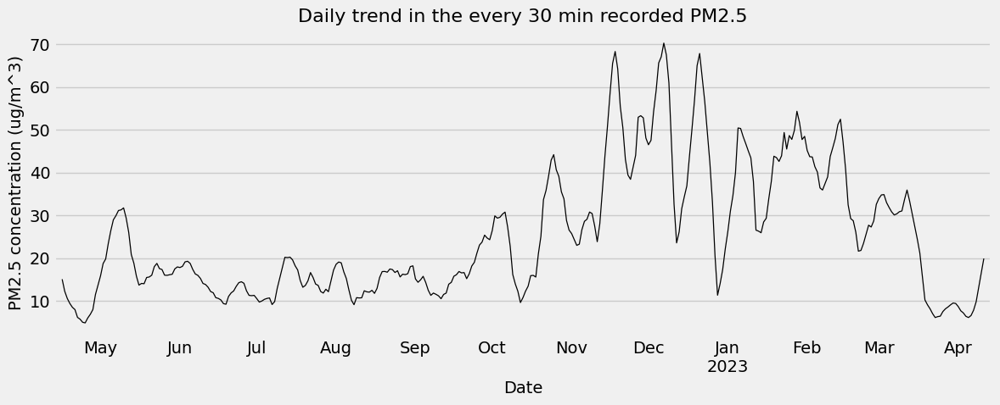

In [ ]:
# find the daily average of PM2.5 contained in the air in any given hour
daily_data = chennai[['From Date','PM2.5']]
daily_data = daily_data.set_index('From Date')
daily_data = daily_data.resample('D').median()
decomposition = seasonal_decompose(daily_data,model='addictive')

# plot the data
with plt.style.context('fivethirtyeight'):
    decomposition.trend.plot(figsize=(12,5),style='k-',linewidth=.9,legend=False)
    plt.xlabel('Date',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Daily trend in the every 30 min recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

In [ ]:
chennai['month'] = chennai['From Date'].dt.month
chennai['hour'] = chennai['From Date'].dt.hour

In which month does the amount of PM2.5 contained in the air rises

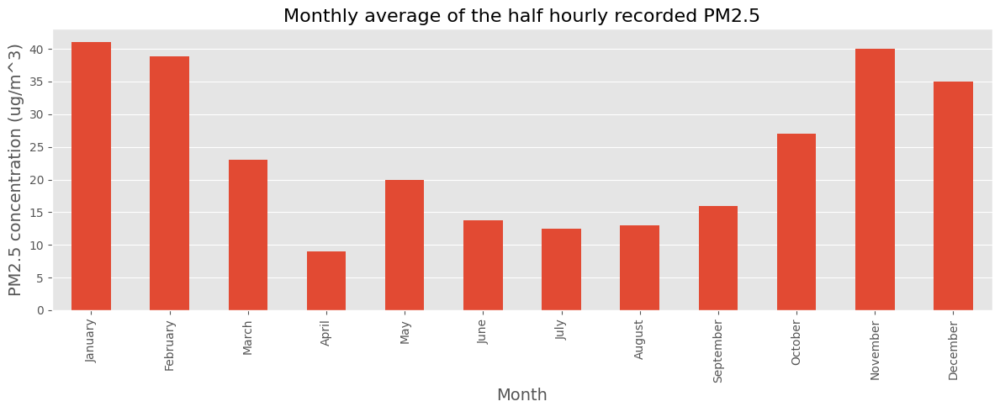

In [ ]:
monthly_data = chennai[['month','PM2.5']]
months = ['January','February','March','April','May','June','July',
         'August','September','October','November','December']
ordered_monthdf = pd.DataFrame(months,columns=['month'])
map_dict = {}
for i,j in enumerate(months):
    map_dict.setdefault(i+1,j)

monthly_data.month = monthly_data.month.map(map_dict)
monthly_average = monthly_data.groupby('month').median()
monthly_average = pd.merge(ordered_monthdf,monthly_average,left_on='month',right_index=True)
monthly_average = np.round(monthly_average,1)
monthly_average = monthly_average.set_index('month')

# plot the data
with plt.style.context('ggplot'):
    monthly_average.plot(figsize=(12,5),legend=False,kind='bar',linewidth=.9)
    plt.xlabel('Month',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Monthly average of the half hourly recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

At what time of the day do we expect the amount of PM2.5 concentration in the air to be high

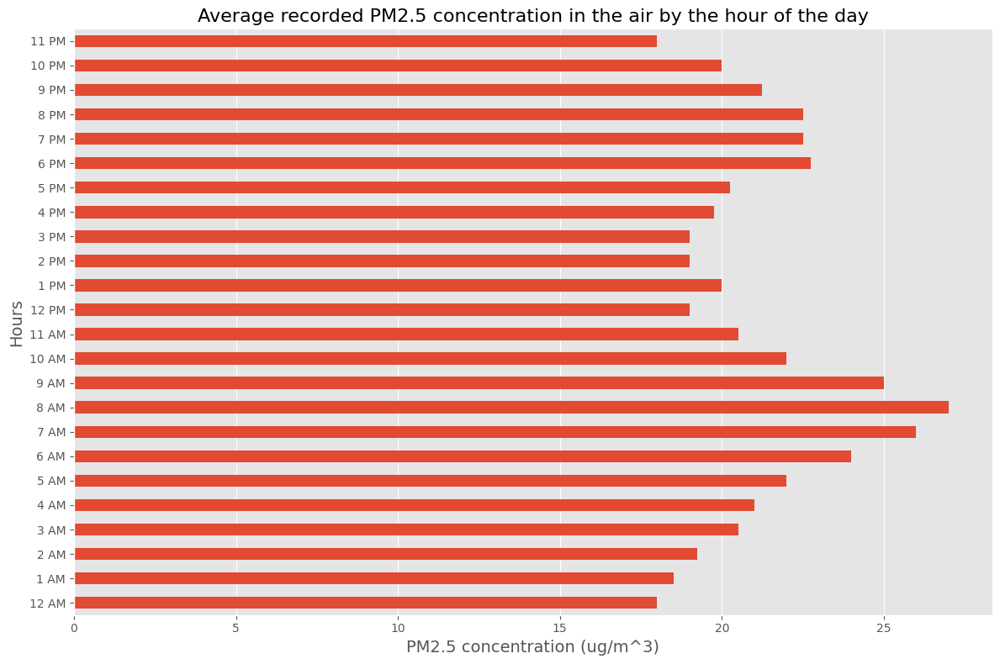

In [ ]:
hourly_data = chennai[['hour','PM2.5']]
hrs = ['12 AM','1 AM','2 AM','3 AM','4 AM','5 AM','6 AM','7 AM','8 AM','9 AM','10 AM',
      '11 AM','12 PM','1 PM','2 PM','3 PM','4 PM','5 PM','6 PM','7 PM',
      '8 PM','9 PM','10 PM','11 PM']
hour_dict = {}
for i,j in enumerate(hrs):
    hour_dict.setdefault(i,j)

hourly_data = hourly_data.groupby('hour').median().reset_index()
hourly_data.hour = hourly_data.hour.map(hour_dict)
hourly_data = hourly_data.set_index('hour')

# plot the data
with plt.style.context('ggplot'):
    hourly_data.plot(figsize=(12,8),legend=False,kind='barh',linewidth=.9)
    plt.ylabel('Hours',fontsize=14)
    plt.xlabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Average recorded PM2.5 concentration in the air by the hour of the day',fontsize=16)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

How do the other environmental factors affect the amount of PM2.5  in the air

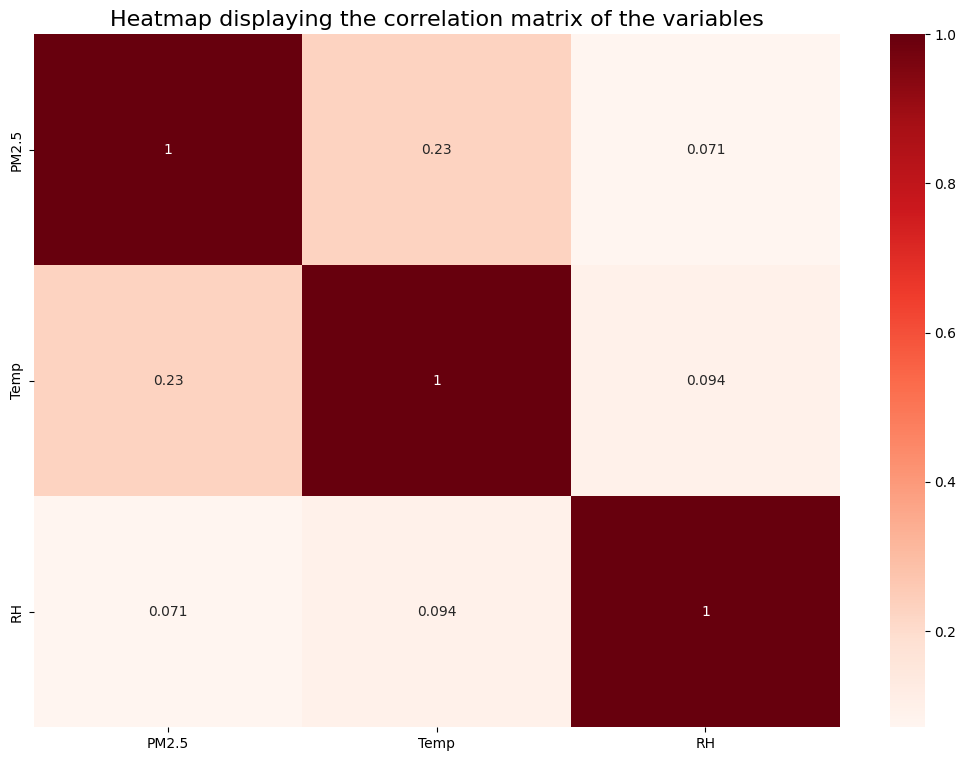

In [ ]:
plt.figure(figsize=(13,9))
correlation_data = chennai[['PM2.5', 'Temp', 'RH']]
sns.heatmap(correlation_data.corr(),cmap=plt.cm.Reds,annot=True)
plt.title('Heatmap displaying the correlation matrix of the variables',fontsize=16)
plt.show()

In [ ]:
chennai.set_index('From Date', inplace=True)

Creating temparory data which holds average of Original data for every Hour

In [ ]:
temp_data = chennai[['PM2.5', 'Temp', 'RH']].groupby(pd.Grouper(freq="H")).mean()
temp_data.head()

,PM2.5,Temp,RH
From Date,,,
2022-04-13 00:00:00,27.627674,20.700,77.25
2022-04-13 01:00:00,27.627674,20.725,76.25
2022-04-13 02:00:00,27.627674,20.650,77.75
2022-04-13 03:00:00,22.313837,20.650,81.00
2022-04-13 04:00:00,17.000000,20.950,84.00


In [ ]:
temp_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8785 entries, 2022-04-13 00:00:00 to 2023-04-14 00:00:00
Freq: H
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   PM2.5   8785 non-null   float64
 1   Temp    8785 non-null   float64
 2   RH      8785 non-null   float64
dtypes: float64(3)
memory usage: 274.5 KB


Here we are creating a function which shows line graphs of all features and shows the tred is downword or upword.

In [ ]:
def ts_graph(chennai):
  figure, axis = plt.subplots(3,figsize=(15, 15))
  mean_rolling = chennai.rolling(window=24).mean()
  std_rollling = chennai.rolling(window=24).std()

  axis[0].plot(chennai.index, chennai['PM2.5'], color='tab:red',label = "Original")
  axis[0].plot(mean_rolling['PM2.5'],color = "black",label = 'Trend')
  axis[0].set_title("PM2.5")

  axis[1].plot(chennai.index, chennai['Temp'], color='tab:red',label = "Original")
  axis[1].plot(mean_rolling['Temp'],color = "black",label = 'Trend')
  axis[1].set_title("Temp")

  axis[2].plot(chennai.index, chennai['RH'], color='tab:red',label = "Original")
  axis[2].plot(mean_rolling['RH'],color = "black",label = 'Trend')
  axis[2].set_title("RH")

created function which shows time series graph for all features. I have calculated the rolling mean and std_rolling. we use rolling mean to get trend of data

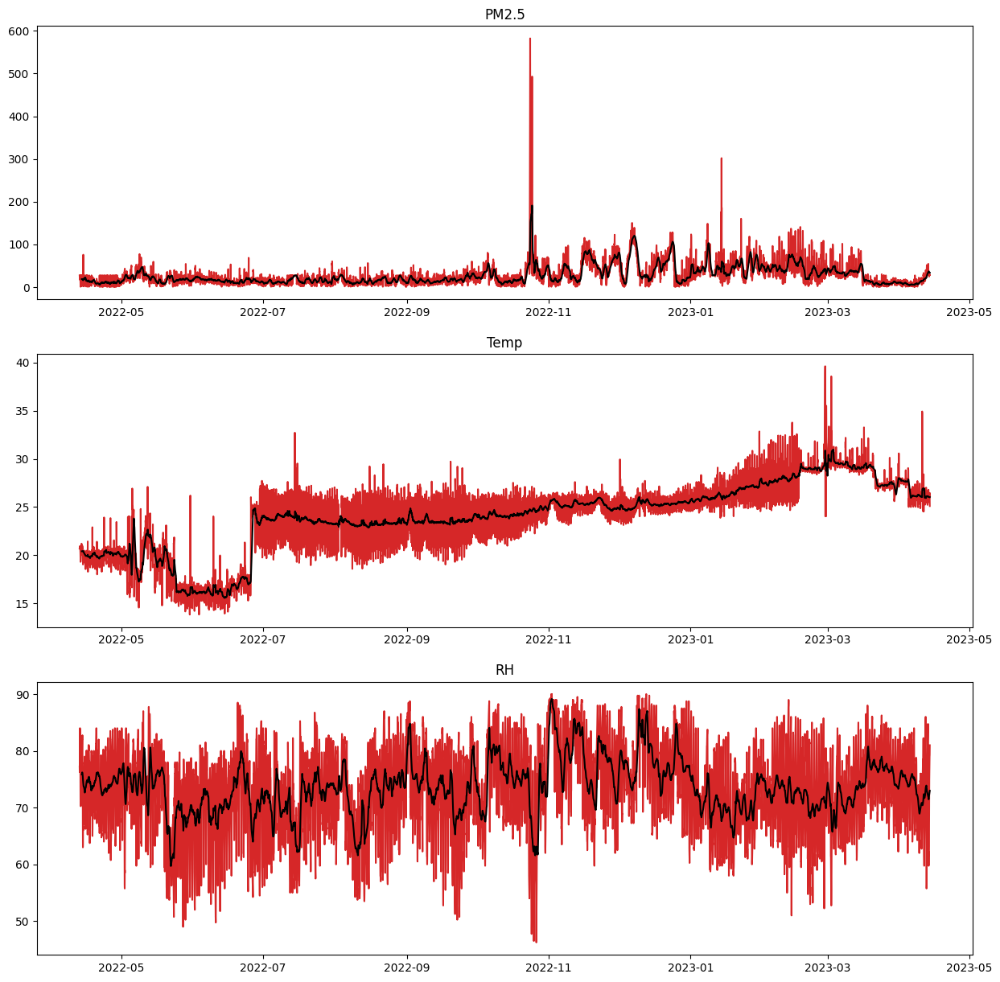

In [ ]:
ts_graph(temp_data)

The red line shows sesonality of data and the black indicate trend of the data.

we can see all the feature are  stationary except Temp

create function which provide statistical data about the data to verify stationarity of data.

In [ ]:
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
def test_stationary(chennai):
  chennai.dropna(axis = 0,inplace = True)
  dftest_PM2 = adfuller(chennai['PM2.5'])
  dftest_Temp = adfuller(chennai['Temp'])
  dftest_RH = adfuller(chennai['RH'])
  values = {'index':['ADF','P-Value','Num of Lags','Num of Observations'],
            'PM2.5':[i for i in dftest_PM2[:-2]],'Temp':[i for i in dftest_Temp[:-2]],
            'RH':[i for i in dftest_RH[:-2]]}
  return pd.DataFrame(values)


We have used adfuller model to check stationarity of data

In [ ]:
test_stationary(temp_data)

,index,PM2.5,Temp,RH
0,ADF,-7.538564e+00,-1.907917,-7.870462e+00
1,P-Value,3.426182e-11,0.328346,5.001189e-12
2,Num of Lags,3.300000e+01,36.000000,3.200000e+01
3,Num of Observations,8.751000e+03,8748.000000,8.752000e+03


In Adfullter test, if we get p-value less than 0.05 than we consider the data is stationary.

In [ ]:
chennai.reset_index('From Date', inplace=True)

In [ ]:
chennai.head()

,From Date,PM2.5,Temp,RH,month,hour
0,2022-04-13 00:00:00,27.627674,20.60,78.0,4,0
1,2022-04-13 00:30:00,27.627674,20.80,76.5,4,0
2,2022-04-13 01:00:00,27.627674,20.75,76.0,4,1
3,2022-04-13 01:30:00,27.627674,20.70,76.5,4,1
4,2022-04-13 02:00:00,27.627674,20.70,77.5,4,2


Drop unnecessary columns

In [ ]:
chennai=chennai.drop(['Temp','RH','month','hour'],axis=1)

In [ ]:
chennai.columns

Index(['From Date', 'PM2.5'], dtype='object')

In [ ]:
from prophet import  Prophet

We  rename our dataframe columns before feeding it into the model.
Format data for prophet model using ds and y

In [ ]:
m = Prophet()
chennai.columns = ['ds','y']

fit the data

In [ ]:
model = m.fit(chennai)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2yhn_tj8/p2asqcqz.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2yhn_tj8/v7cc_tan.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=30146', 'data', 'file=/tmp/tmp2yhn_tj8/p2asqcqz.json', 'init=/tmp/tmp2yhn_tj8/v7cc_tan.json', 'output', 'file=/tmp/tmp2yhn_tj8/prophet_model07__hn0i/prophet_model-20240415032448.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:24:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:25:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Future predict of next 24 hours

In [ ]:
future = m.make_future_dataframe(periods=24,freq='H')
forecast = m.predict(future)
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
17588,2023-04-14 20:00:00,6.005161,-22.671420,34.535476,6.005161,6.005161,-0.716549,-0.716549,-0.716549,1.085350,1.085350,1.085350,-1.801899,-1.801899,-1.801899,0.0,0.0,0.0,5.288612
17589,2023-04-14 21:00:00,5.978664,-23.804496,34.803575,5.978664,5.978664,-1.573181,-1.573181,-1.573181,0.270200,0.270200,0.270200,-1.843381,-1.843381,-1.843381,0.0,0.0,0.0,4.405483
17590,2023-04-14 22:00:00,5.952167,-27.143065,30.446340,5.952167,5.952167,-3.408392,-3.408392,-3.408392,-1.527911,-1.527911,-1.527911,-1.880481,-1.880481,-1.880481,0.0,0.0,0.0,2.543774
17591,2023-04-14 23:00:00,5.925670,-26.719987,30.953279,5.925670,5.925670,-4.778853,-4.778853,-4.778853,-2.866147,-2.866147,-2.866147,-1.912707,-1.912707,-1.912707,0.0,0.0,0.0,1.146816
17592,2023-04-15 00:00:00,5.899172,-28.024319,30.819530,5.899172,5.899172,-4.844527,-4.844527,-4.844527,-2.904967,-2.904967,-2.904967,-1.939561,-1.939561,-1.939561,0.0,0.0,0.0,1.054645


Plot the forecast

In [ ]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

Plot the components

In [ ]:
plot_components_plotly(m, forecast)

Delhi

In [ ]:
delhi.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17569 entries, 0 to 17568
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   From Date  17569 non-null  object 
 1   PM2.5      17241 non-null  float64
 2   Temp       0 non-null      float64
 3   RH         17477 non-null  float64
dtypes: float64(3), object(1)
memory usage: 549.2+ KB


Check Null Values

In [ ]:
delhi.isnull().sum()

From Date        0
PM2.5          328
Temp         17569
RH              92
dtype: int64

In [ ]:
delhi=delhi.drop(['Temp'],axis=1)

Fill the missing values with mean

In [ ]:
col2=['PM2.5','RH']
delhi[col2] = delhi[col2].fillna(delhi[col2].mean())

Transform From Date column type to date time type

In [ ]:
delhi['From Date']=pd.to_datetime(delhi['From Date'])


In [ ]:
delhi.head()

,From Date,PM2.5,RH
0,2022-04-13 00:00:00,119.0,73.70
1,2022-04-13 00:30:00,120.0,75.75
2,2022-04-13 01:00:00,121.0,75.95
3,2022-04-13 01:30:00,121.0,75.65
4,2022-04-13 02:00:00,121.0,74.00


# **Exploratory Data Analysis**

Before we start fitting a machine learning model on the data, we need to know much about the data by performing an Exploratory Data Analysis to gain insight from it. EDA is simply describing the data by means of visualization.

In [ ]:
fig = px.line(delhi, x='From Date', y='PM2.5', title='PM2.5')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.show()

Pattern of the amount of PM2.5  in the air recorded in half of an hour follow for a daily time period

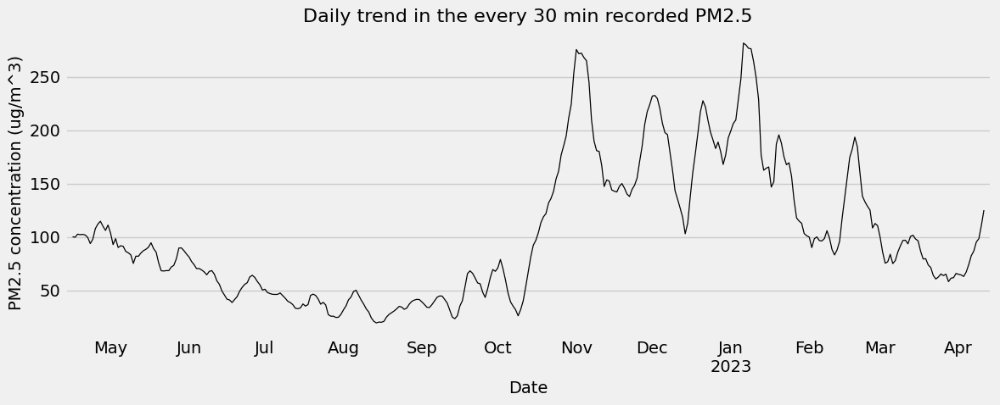

In [ ]:
# find the daily average of PM2.5 contained in the air in any given hour
daily_data = delhi[['From Date','PM2.5']]
daily_data = daily_data.set_index('From Date')
daily_data = daily_data.resample('D').median()
decomposition = seasonal_decompose(daily_data,model='addictive')

# plot the data
with plt.style.context('fivethirtyeight'):
    decomposition.trend.plot(figsize=(12,5),style='k-',linewidth=.9,legend=False)
    plt.xlabel('Date',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Daily trend in the every 30 min recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

In [ ]:
delhi['month'] = delhi['From Date'].dt.month
delhi['hour'] = delhi['From Date'].dt.hour

In which month does the amount of PM2.5 contained in the air rises

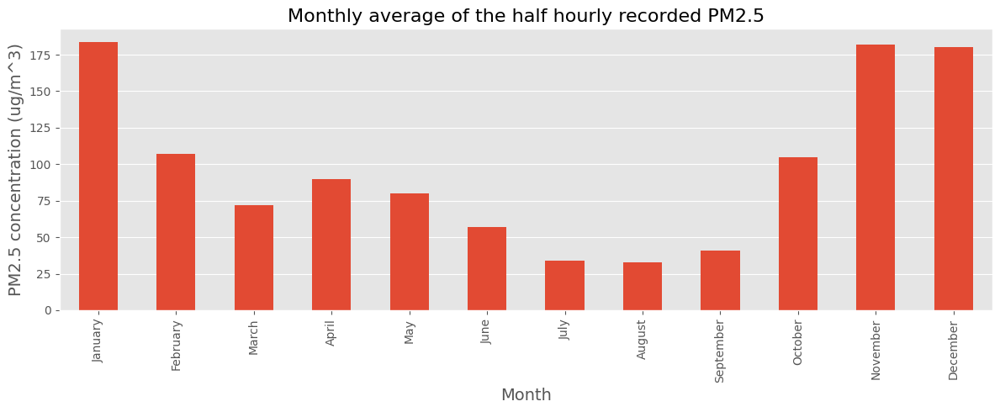

In [ ]:
monthly_data = delhi[['month','PM2.5']]
months = ['January','February','March','April','May','June','July',
         'August','September','October','November','December']
ordered_monthdf = pd.DataFrame(months,columns=['month'])
map_dict = {}
for i,j in enumerate(months):
    map_dict.setdefault(i+1,j)

monthly_data.month = monthly_data.month.map(map_dict)
monthly_average = monthly_data.groupby('month').median()
monthly_average = pd.merge(ordered_monthdf,monthly_average,left_on='month',right_index=True)
monthly_average = np.round(monthly_average,1)
monthly_average = monthly_average.set_index('month')

# plot the data
with plt.style.context('ggplot'):
    monthly_average.plot(figsize=(12,5),legend=False,kind='bar',linewidth=.9)
    plt.xlabel('Month',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Monthly average of the half hourly recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

At what time of the day do we expect the amount of PM2.5 concentration in the air to be high

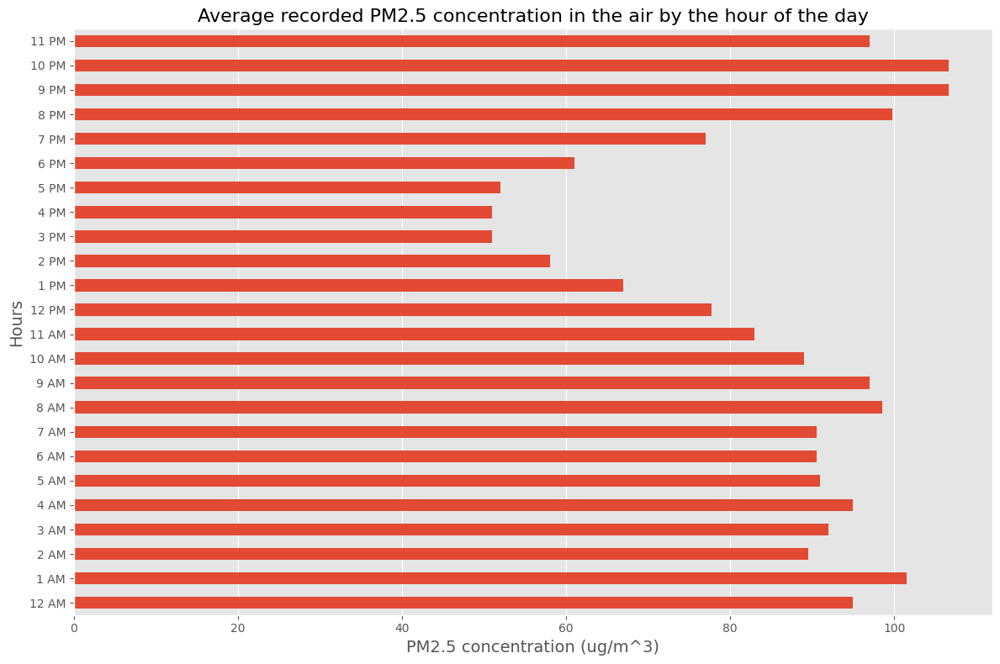

In [ ]:
hourly_data = delhi[['hour','PM2.5']]
hrs = ['12 AM','1 AM','2 AM','3 AM','4 AM','5 AM','6 AM','7 AM','8 AM','9 AM','10 AM',
      '11 AM','12 PM','1 PM','2 PM','3 PM','4 PM','5 PM','6 PM','7 PM',
      '8 PM','9 PM','10 PM','11 PM']
hour_dict = {}
for i,j in enumerate(hrs):
    hour_dict.setdefault(i,j)

hourly_data = hourly_data.groupby('hour').median().reset_index()
hourly_data.hour = hourly_data.hour.map(hour_dict)
hourly_data = hourly_data.set_index('hour')

# plot the data
with plt.style.context('ggplot'):
    hourly_data.plot(figsize=(12,8),legend=False,kind='barh',linewidth=.9)
    plt.ylabel('Hours',fontsize=14)
    plt.xlabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Average recorded PM2.5 concentration in the air by the hour of the day',fontsize=16)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

How do the other environmental factors affect the amount of PM2.5  in the air

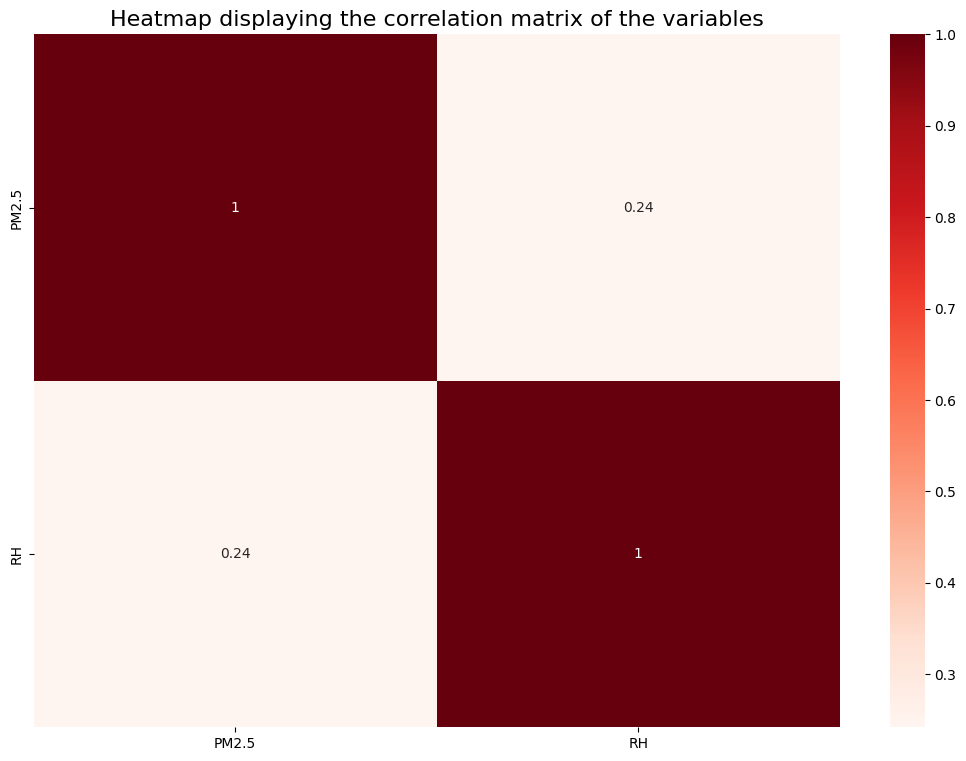

In [ ]:
plt.figure(figsize=(13,9))
correlation_data = delhi[['PM2.5', 'RH']]
sns.heatmap(correlation_data.corr(),cmap=plt.cm.Reds,annot=True)
plt.title('Heatmap displaying the correlation matrix of the variables',fontsize=16)
plt.show()

In [ ]:
delhi.set_index('From Date', inplace=True)

Creating temparory data which holds average of Original data for every Hour

In [ ]:
temp_data2 = delhi[['PM2.5', 'RH']].groupby(pd.Grouper(freq="H")).mean()
temp_data2.head()

,PM2.5,RH
From Date,,
2022-04-13 00:00:00,119.5,74.725
2022-04-13 01:00:00,121.0,75.800
2022-04-13 02:00:00,118.5,73.025
2022-04-13 03:00:00,113.0,71.825
2022-04-13 04:00:00,121.0,78.425


Here we are creating a function which shows line graphs of all features and shows the tred is downword or upword.

In [ ]:
def ts_graph2(delhi):
  figure, axis = plt.subplots(2,figsize=(15, 15))
  mean_rolling = delhi.rolling(window=24).mean()
  std_rollling = delhi.rolling(window=24).std()

  axis[0].plot(delhi.index, delhi['PM2.5'], color='tab:red',label = "Original")
  axis[0].plot(mean_rolling['PM2.5'],color = "black",label = 'Trend')
  axis[0].set_title("PM2.5")

  axis[1].plot(delhi.index, delhi['RH'], color='tab:red',label = "Original")
  axis[1].plot(mean_rolling['RH'],color = "black",label = 'Trend')
  axis[1].set_title("RH")

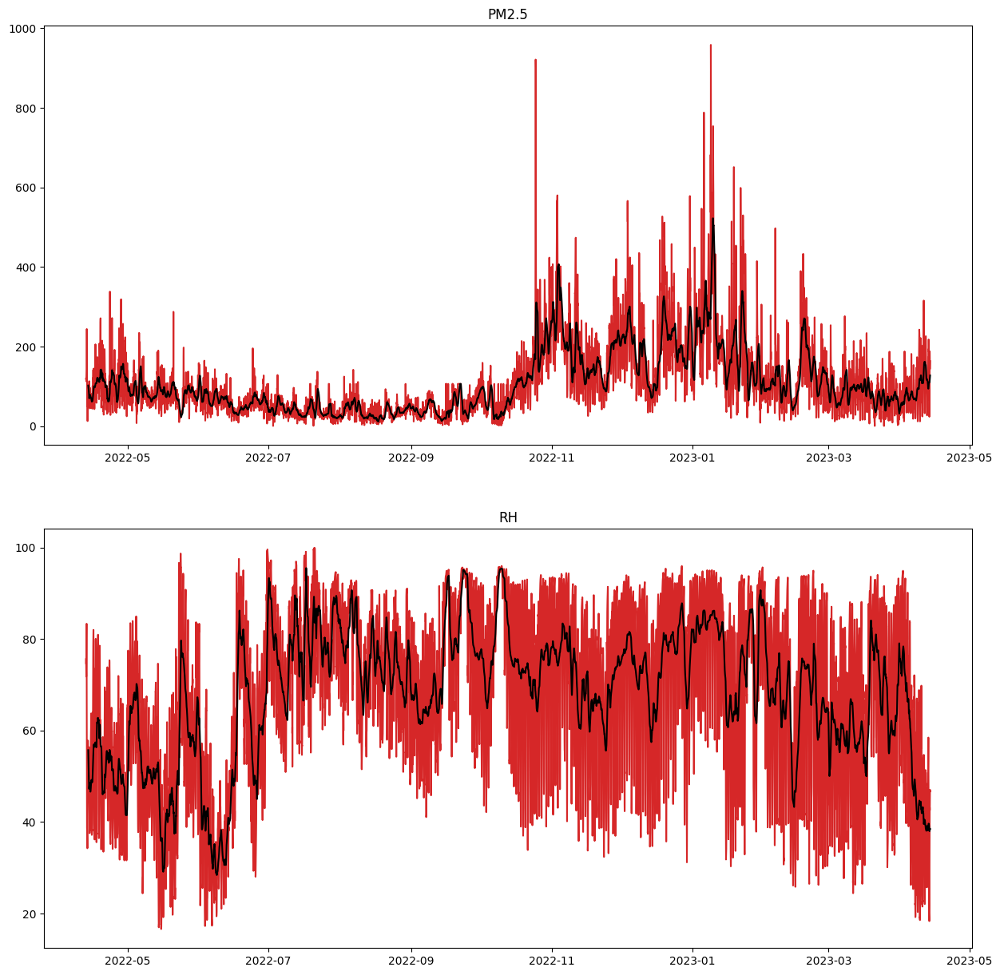

In [ ]:
ts_graph2(temp_data2)

he red line shows sesonality of data and the black indicate trend of the data.

we can see all the feature are stationary except Temp

create function which provide statistical data about the data to verify stationarity of data.

In [ ]:
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
def test_stationary_d(delhi):
  delhi.dropna(axis = 0,inplace = True)
  dftest_PM2 = adfuller(delhi['PM2.5'])
  dftest_RH = adfuller(delhi['RH'])
  values = {'index':['ADF','P-Value','Num of Lags','Num of Observations'],
            'PM2.5':[i for i in dftest_PM2[:-2]],
            'RH':[i for i in dftest_RH[:-2]]}
  return pd.DataFrame(values)

We have used adfuller model to check stationarity of data

In [ ]:
test_stationary_d(temp_data2)

,index,PM2.5,RH
0,ADF,-6.026726e+00,-5.726079e+00
1,P-Value,1.449998e-07,6.766508e-07
2,Num of Lags,2.500000e+01,3.600000e+01
3,Num of Observations,8.759000e+03,8.748000e+03


In Adfullter test, if we get p-value less than 0.05 than we consider the data is stationary

In [ ]:
delhi.reset_index('From Date', inplace=True)

In [ ]:
delhi.head()

,From Date,PM2.5,RH,month,hour
0,2022-04-13 00:00:00,119.0,73.70,4,0
1,2022-04-13 00:30:00,120.0,75.75,4,0
2,2022-04-13 01:00:00,121.0,75.95,4,1
3,2022-04-13 01:30:00,121.0,75.65,4,1
4,2022-04-13 02:00:00,121.0,74.00,4,2


In [ ]:
delhi=delhi.drop(['RH','month','hour'],axis=1)

In [ ]:
m2 = Prophet()
delhi.columns = ['ds','y']

In [ ]:
model2 = m2.fit(delhi)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2yhn_tj8/tw7_8mjs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2yhn_tj8/4h8d8wnt.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83091', 'data', 'file=/tmp/tmp2yhn_tj8/tw7_8mjs.json', 'init=/tmp/tmp2yhn_tj8/4h8d8wnt.json', 'output', 'file=/tmp/tmp2yhn_tj8/prophet_modelq2pul0t7/prophet_model-20240415040334.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:03:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:03:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Future predict of next 24 hours

Future predict of next 24 hours

In [ ]:
future = m2.make_future_dataframe(periods=24,freq='H')
forecast2 = m2.predict(future)
forecast2.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
17588,2023-04-14 20:00:00,75.192649,22.318580,180.487973,75.192649,75.192649,27.184677,27.184677,27.184677,23.130282,23.130282,23.130282,4.054395,4.054395,4.054395,0.0,0.0,0.0,102.377326
17589,2023-04-14 21:00:00,75.165326,45.799569,193.080874,75.165326,75.165326,42.041238,42.041238,42.041238,37.949801,37.949801,37.949801,4.091437,4.091437,4.091437,0.0,0.0,0.0,117.206564
17590,2023-04-14 22:00:00,75.138003,39.521564,194.979694,75.138003,75.138003,43.675051,43.675051,43.675051,39.558569,39.558569,39.558569,4.116482,4.116482,4.116482,0.0,0.0,0.0,118.813054
17591,2023-04-14 23:00:00,75.110680,31.185722,195.374007,75.110680,75.110680,35.786753,35.786753,35.786753,31.657735,31.657735,31.657735,4.129018,4.129018,4.129018,0.0,0.0,0.0,110.897434
17592,2023-04-15 00:00:00,75.083357,26.723426,179.150119,75.083357,75.083357,25.737461,25.737461,25.737461,21.608877,21.608877,21.608877,4.128584,4.128584,4.128584,0.0,0.0,0.0,100.820818


plot the forecast

In [ ]:
plot_plotly(m2, forecast2)

Plot the components

In [ ]:
plot_components_plotly(m2, forecast2)

Mumbai

In [ ]:
mumbai.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17569 entries, 0 to 17568
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   From Date  17569 non-null  object 
 1   PM2.5      12462 non-null  float64
 2   RH         14407 non-null  float64
dtypes: float64(2), object(1)
memory usage: 411.9+ KB


In [ ]:
mumbai.head()

,From Date,PM2.5,RH
0,13-04-2022 00:00,42.0,99.9
1,13-04-2022 00:30,66.0,99.9
2,13-04-2022 01:00,NaN,NaN
3,13-04-2022 01:30,NaN,NaN
4,13-04-2022 02:00,NaN,NaN


Check Null Values

In [ ]:
mumbai.isnull().sum()

From Date       0
PM2.5        5107
RH           3162
dtype: int64

Fill the missing values with mean

In [ ]:
col3=['PM2.5','RH']
mumbai[col3] = mumbai[col3].fillna(mumbai[col3].mean())

Transform From Date column type to date time type

In [ ]:
mumbai['From Date']=pd.to_datetime(mumbai['From Date'])


# **Exploratory Data Analysis**

Before we start fitting a machine learning model on the data, we need to know much about the data by performing an Exploratory Data Analysis to gain insight from it. EDA is simply describing the data by means of visualization.

In [ ]:
fig = px.line(mumbai, x='From Date', y='PM2.5', title='PM2.5')

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(step="all")
        ])
    )
)
fig.show()


In [ ]:
# find the daily average of PM2.5 contained in the air in any given hour
daily_data = chennai[['From Date','PM2.5']]
daily_data = daily_data.set_index('From Date')
daily_data = daily_data.resample('D').median()
decomposition = seasonal_decompose(daily_data,model='addictive')

# plot the data
with plt.style.context('fivethirtyeight'):
    decomposition.trend.plot(figsize=(12,5),style='k-',linewidth=.9,legend=False)
    plt.xlabel('Date',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Daily trend in the every 30 min recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

Pattern of the amount of PM2.5  in the air recorded in half of an hour follow for a daily time period

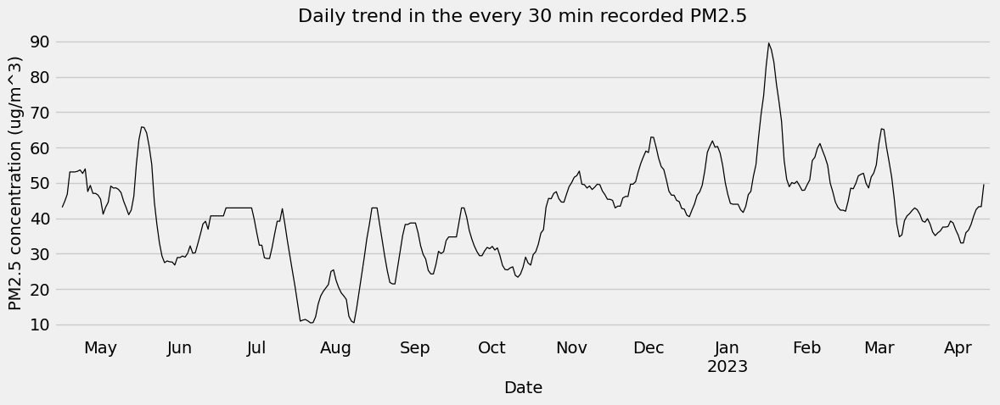

In [ ]:
# find the daily average of PM2.5 contained in the air in any given hour
daily_data = mumbai[['From Date','PM2.5']]
daily_data = daily_data.set_index('From Date')
daily_data = daily_data.resample('D').median()
decomposition = seasonal_decompose(daily_data,model='addictive')

# plot the data
with plt.style.context('fivethirtyeight'):
    decomposition.trend.plot(figsize=(12,5),style='k-',linewidth=.9,legend=False)
    plt.xlabel('Date',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Daily trend in the every 30 min recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

In [ ]:
mumbai['month'] = mumbai['From Date'].dt.month
mumbai['hour'] = mumbai['From Date'].dt.hour

In which month does the amount of PM2.5 contained in the air rises

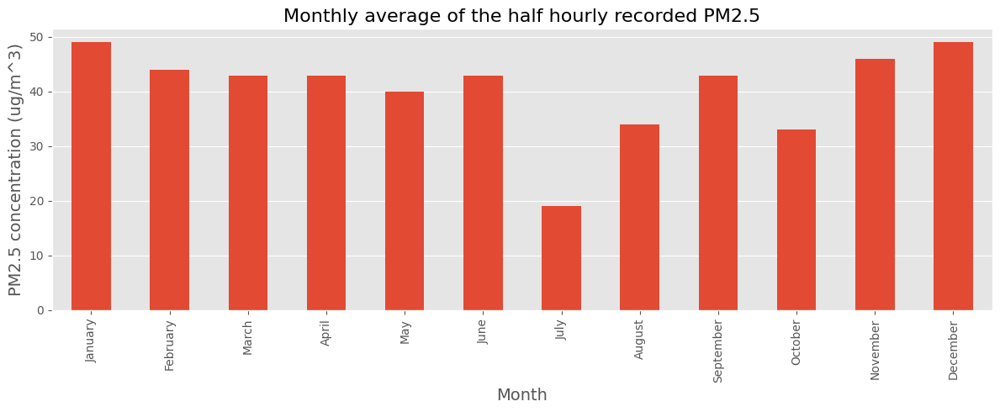

In [ ]:
monthly_data = mumbai[['month','PM2.5']]
months = ['January','February','March','April','May','June','July',
         'August','September','October','November','December']
ordered_monthdf = pd.DataFrame(months,columns=['month'])
map_dict = {}
for i,j in enumerate(months):
    map_dict.setdefault(i+1,j)

monthly_data.month = monthly_data.month.map(map_dict)
monthly_average = monthly_data.groupby('month').median()
monthly_average = pd.merge(ordered_monthdf,monthly_average,left_on='month',right_index=True)
monthly_average = np.round(monthly_average,1)
monthly_average = monthly_average.set_index('month')

# plot the data
with plt.style.context('ggplot'):
    monthly_average.plot(figsize=(12,5),legend=False,kind='bar',linewidth=.9)
    plt.xlabel('Month',fontsize=14)
    plt.ylabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Monthly average of the half hourly recorded PM2.5',fontsize=16)
    plt.grid(axis='x')
    plt.tight_layout()
    plt.show()

At what time of the day do we expect the amount of PM2.5 concentration in the air to be high

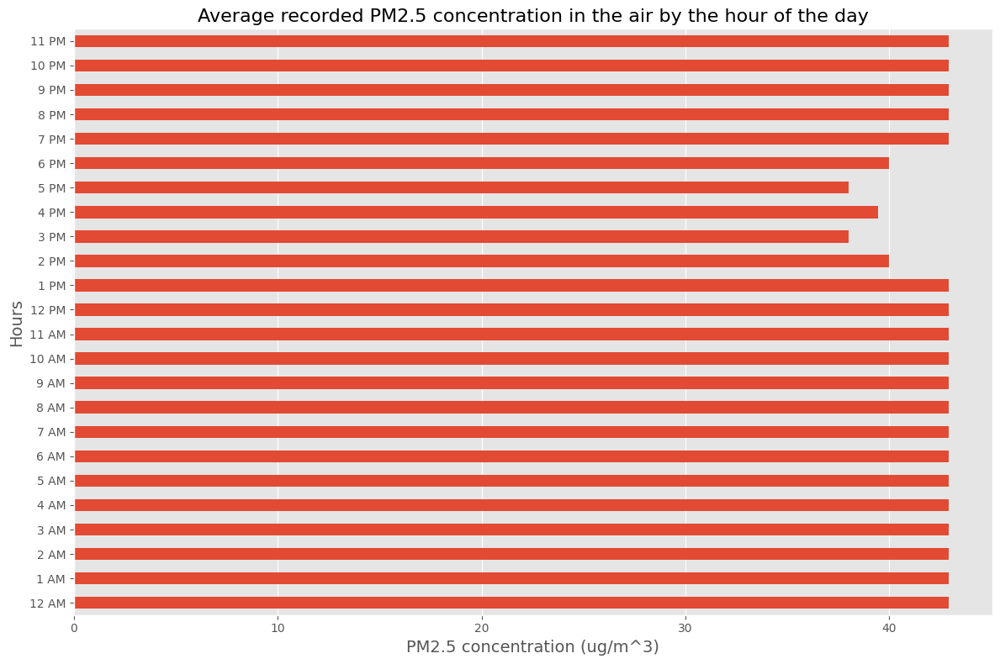

In [ ]:
hourly_data = mumbai[['hour','PM2.5']]
hrs = ['12 AM','1 AM','2 AM','3 AM','4 AM','5 AM','6 AM','7 AM','8 AM','9 AM','10 AM',
      '11 AM','12 PM','1 PM','2 PM','3 PM','4 PM','5 PM','6 PM','7 PM',
      '8 PM','9 PM','10 PM','11 PM']
hour_dict = {}
for i,j in enumerate(hrs):
    hour_dict.setdefault(i,j)

hourly_data = hourly_data.groupby('hour').median().reset_index()
hourly_data.hour = hourly_data.hour.map(hour_dict)
hourly_data = hourly_data.set_index('hour')

# plot the data
with plt.style.context('ggplot'):
    hourly_data.plot(figsize=(12,8),legend=False,kind='barh',linewidth=.9)
    plt.ylabel('Hours',fontsize=14)
    plt.xlabel('PM2.5 concentration (ug/m^3)',fontsize=14)
    plt.title('Average recorded PM2.5 concentration in the air by the hour of the day',fontsize=16)
    plt.grid(axis='y')
    plt.tight_layout()
    plt.show()

How do the other environmental factors affect the amount of PM2.5  in the air

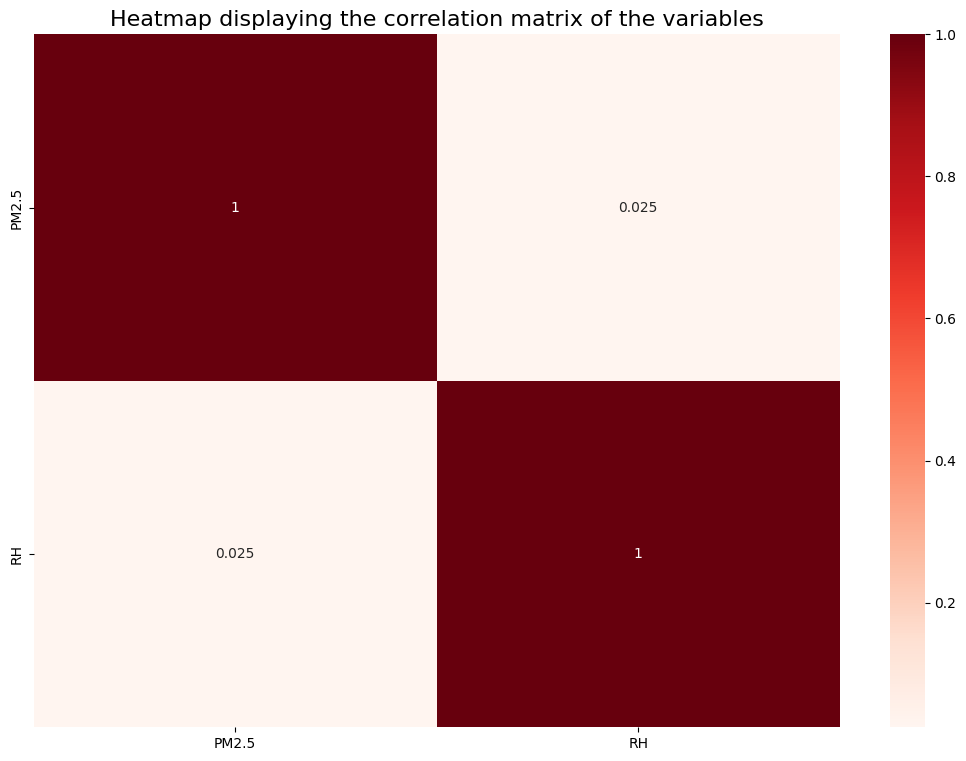

In [ ]:
plt.figure(figsize=(13,9))
correlation_data = mumbai[['PM2.5', 'RH']]
sns.heatmap(correlation_data.corr(),cmap=plt.cm.Reds,annot=True)
plt.title('Heatmap displaying the correlation matrix of the variables',fontsize=16)
plt.show()

In [ ]:
mumbai.set_index('From Date', inplace=True)

Creating temparory data which holds average of Original data for every Hour

In [ ]:
temp_data3 = mumbai[['PM2.5', 'RH']].groupby(pd.Grouper(freq="H")).mean()
temp_data3.head()

,PM2.5,RH
From Date,,
2022-04-13 00:00:00,54.000000,99.900000
2022-04-13 01:00:00,42.912868,71.644097
2022-04-13 02:00:00,42.912868,71.644097
2022-04-13 03:00:00,66.956434,85.772048
2022-04-13 04:00:00,66.956434,85.772048


Here we are creating a function which shows line graphs of all features and shows the tred is downword or upword.

In [ ]:
def ts_graph_m(mumbai):
  figure, axis = plt.subplots(2,figsize=(15, 15))
  mean_rolling = mumbai.rolling(window=24).mean()
  std_rollling = mumbai.rolling(window=24).std()

  axis[0].plot(mumbai.index, mumbai['PM2.5'], color='tab:red',label = "Original")
  axis[0].plot(mean_rolling['PM2.5'],color = "black",label = 'Trend')
  axis[0].set_title("PM2.5")


  axis[1].plot(mumbai.index, mumbai['RH'], color='tab:red',label = "Original")
  axis[1].plot(mean_rolling['RH'],color = "black",label = 'Trend')
  axis[1].set_title("RH")

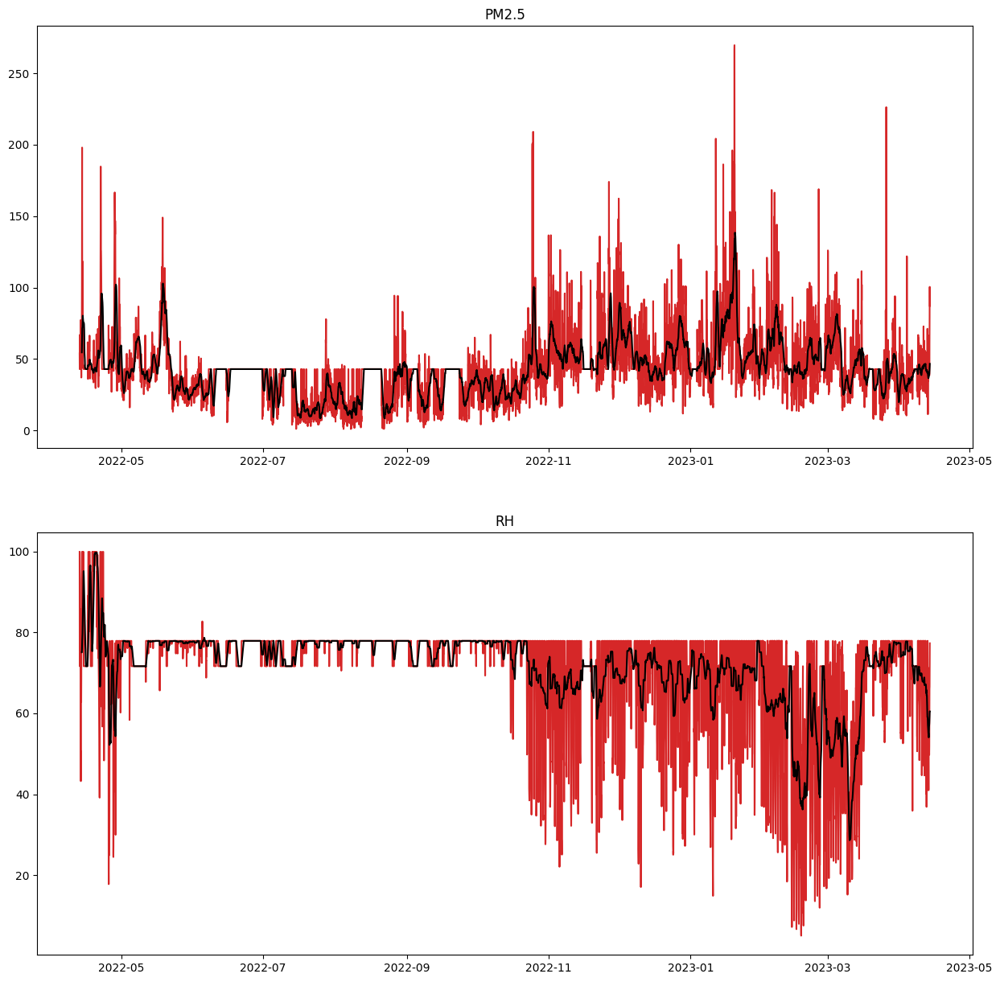

In [ ]:
ts_graph_m(temp_data3)

he red line shows sesonality of data and the black indicate trend of the data.

we can see all the feature are  stationary except Temp

create function which provide statistical data about the data to verify stationarity of data.

In [ ]:
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm
def test_stationary3(mumbai):
  mumbai.dropna(axis = 0,inplace = True)
  dftest_PM2 = adfuller(mumbai['PM2.5'])
  dftest_RH = adfuller(mumbai['RH'])
  values = {'index':['ADF','P-Value','Num of Lags','Num of Observations'],
            'PM2.5':[i for i in dftest_PM2[:-2]],
            'RH':[i for i in dftest_RH[:-2]]}
  return pd.DataFrame(values)


We have used adfuller model to check stationarity of data

In [ ]:
test_stationary3(temp_data3)

,index,PM2.5,RH
0,ADF,-7.316245e+00,-6.579837e+00
1,P-Value,1.227150e-10,7.562784e-09
2,Num of Lags,3.700000e+01,2.900000e+01
3,Num of Observations,8.747000e+03,8.755000e+03


In Adfullter test, if we get p-value less than 0.05 than we consider the data is stationary

In [ ]:
mumbai.reset_index('From Date', inplace=True)

In [ ]:
mumbai.head()

,From Date,PM2.5,RH,month,hour
0,2022-04-13 00:00:00,42.000000,99.900000,4,0
1,2022-04-13 00:30:00,66.000000,99.900000,4,0
2,2022-04-13 01:00:00,42.912868,71.644097,4,1
3,2022-04-13 01:30:00,42.912868,71.644097,4,1
4,2022-04-13 02:00:00,42.912868,71.644097,4,2


In [ ]:
mumbai=mumbai.drop(['RH','month','hour'],axis=1)

In [ ]:
m3 = Prophet()
mumbai.columns = ['ds','y']

In [ ]:
model3 = m3.fit(mumbai)

INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2yhn_tj8/tejfez7t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp2yhn_tj8/ctznzr8n.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23731', 'data', 'file=/tmp/tmp2yhn_tj8/tejfez7t.json', 'init=/tmp/tmp2yhn_tj8/ctznzr8n.json', 'output', 'file=/tmp/tmp2yhn_tj8/prophet_model7zt151p5/prophet_model-20240415042859.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:28:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:29:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Future predict of next 24 hours

In [ ]:
future = m3.make_future_dataframe(periods=24,freq='H')
forecast3 = m3.predict(future)
forecast3.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
17588,2023-04-14 20:00:00,35.195001,12.949361,60.547698,35.195001,35.195001,-0.302704,-0.302704,-0.302704,0.613984,0.613984,0.613984,-0.916688,-0.916688,-0.916688,0.0,0.0,0.0,34.892297
17589,2023-04-14 21:00:00,35.182648,14.926672,62.245448,35.182648,35.182648,3.959147,3.959147,3.959147,4.820949,4.820949,4.820949,-0.861802,-0.861802,-0.861802,0.0,0.0,0.0,39.141794
17590,2023-04-14 22:00:00,35.170294,17.638997,65.162553,35.170294,35.170294,6.346024,6.346024,6.346024,7.142218,7.142218,7.142218,-0.796194,-0.796194,-0.796194,0.0,0.0,0.0,41.516318
17591,2023-04-14 23:00:00,35.157940,15.534141,64.432861,35.157940,35.157940,6.431055,6.431055,6.431055,7.152187,7.152187,7.152187,-0.721132,-0.721132,-0.721132,0.0,0.0,0.0,41.588994
17592,2023-04-15 00:00:00,35.145586,16.753201,63.671161,35.145586,35.145586,5.109517,5.109517,5.109517,5.747523,5.747523,5.747523,-0.638006,-0.638006,-0.638006,0.0,0.0,0.0,40.255103


Plot the forecast


In [ ]:
plot_plotly(m3, forecast3)

Plot the components

In [ ]:
plot_components_plotly(m3, forecast3)